In [19]:
import os
import glob
import re
import numpy as np
import pandas as pd
import scipy.sparse
from sklearn.cross_decomposition import PLSRegression
from sklearn.neural_network import MLPRegressor
import sklearn.metrics.pairwise as mp
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
X_train = scipy.sparse.load_npz("data/processed_descriptions/train_descriptions.npz")
X_test  = scipy.sparse.load_npz("data/processed_descriptions/test_descriptions.npz")

X_train_nouns = scipy.sparse.load_npz("data/processed_descriptions/train_descriptions_nouns.npz")
X_test_nouns  = scipy.sparse.load_npz("data/processed_descriptions/test_descriptions_nouns.npz")

In [3]:
Y_train = scipy.sparse.load_npz("data/processed_tags/train_tag_nocat_tfdif.npz")
Y_test  = scipy.sparse.load_npz("data/processed_tags/test_tag_nocat_tfdif.npz")

In [4]:
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(10000, 7038) (2000, 7038) (10000, 92) (2000, 92)


In [6]:
resnet_fc1000_train = pd.read_csv("data/features_train/features_resnet1000_train.csv", header = None, index_col = 0)
resnet_train = pd.read_csv("data/features_train/features_resnet1000intermediate_train.csv", header = None, index_col = 0)

resnet_fc1000_test = pd.read_csv("data/features_test/features_resnet1000_test.csv", header = None, index_col = 0)
resnet_test = pd.read_csv("data/features_test/features_resnet1000intermediate_test.csv", header = None, index_col = 0)

print(resnet_fc1000_train.shape, resnet_fc1000_test.shape)
print(resnet_train.shape, resnet_test.shape)

(10000, 1000) (2000, 1000)
(10000, 2048) (2000, 2048)


In [7]:
tr_idx = resnet_train.index
print(tr_idx[0:10])
new_idx1 = [int(re.findall("\d+", idx)[0]) for idx in tr_idx]
print(new_idx1[0:10])
resnet_train = np.array(pd.DataFrame(np.array(resnet_train), index = new_idx1).sort_index())

te_idx = resnet_test.index
print(te_idx[0:10])
new_idx2 = [int(re.findall("\d+", idx)[0]) for idx in te_idx]
print(new_idx2[0:10])
resnet_test = np.array(pd.DataFrame(np.array(resnet_test), index = new_idx2).sort_index())

Index(['images_train/5373.jpg', 'images_train/984.jpg',
       'images_train/7127.jpg', 'images_train/5293.jpg',
       'images_train/3688.jpg', 'images_train/3340.jpg',
       'images_train/4787.jpg', 'images_train/5707.jpg',
       'images_train/1262.jpg', 'images_train/8355.jpg'],
      dtype='object', name=0)
[5373, 984, 7127, 5293, 3688, 3340, 4787, 5707, 1262, 8355]
Index(['images_test/152.jpg', 'images_test/901.jpg', 'images_test/1609.jpg',
       'images_test/501.jpg', 'images_test/517.jpg', 'images_test/1516.jpg',
       'images_test/1822.jpg', 'images_test/1993.jpg', 'images_test/405.jpg',
       'images_test/1718.jpg'],
      dtype='object', name=0)
[152, 901, 1609, 501, 517, 1516, 1822, 1993, 405, 1718]


In [8]:
fc_tr_idx = resnet_fc1000_train.index
print(fc_tr_idx[0:10])
fc_new_idx1 = [int(re.findall("\d+", idx)[0]) for idx in fc_tr_idx]
print(fc_new_idx1[0:10])
resnet_fc1000_train = np.array(pd.DataFrame(np.array(resnet_fc1000_train), index = fc_new_idx1).sort_index())

fc_te_idx = resnet_fc1000_test.index
print(fc_te_idx[0:10])
fc_new_idx2 = [int(re.findall("\d+", idx)[0]) for idx in fc_te_idx]
print(fc_new_idx2[0:10])
resnet_fc1000_test = np.array(pd.DataFrame(np.array(resnet_fc1000_test), index = fc_new_idx2).sort_index())

Index(['images_train/5373.jpg', 'images_train/984.jpg',
       'images_train/7127.jpg', 'images_train/9609.jpg',
       'images_train/5293.jpg', 'images_train/3688.jpg',
       'images_train/3340.jpg', 'images_train/4787.jpg',
       'images_train/5707.jpg', 'images_train/1262.jpg'],
      dtype='object', name=0)
[5373, 984, 7127, 9609, 5293, 3688, 3340, 4787, 5707, 1262]
Index(['images_test/152.jpg', 'images_test/901.jpg', 'images_test/1609.jpg',
       'images_test/501.jpg', 'images_test/517.jpg', 'images_test/1822.jpg',
       'images_test/1993.jpg', 'images_test/832.jpg', 'images_test/1462.jpg',
       'images_test/1718.jpg'],
      dtype='object', name=0)
[152, 901, 1609, 501, 517, 1822, 1993, 832, 1462, 1718]


In [9]:
resnet_train[0:10]

array([[1.03315091, 0.14875449, 0.04642047, ..., 0.07316806, 0.41725951,
        0.19742125],
       [0.23184368, 0.12003349, 0.09078766, ..., 0.27578694, 3.49657249,
        0.06475818],
       [0.62282479, 0.25091803, 0.68479973, ..., 0.46948081, 0.70399392,
        0.23659612],
       ...,
       [0.56402719, 0.29538712, 0.06798451, ..., 0.0225115 , 0.31061313,
        0.55103958],
       [0.93449306, 1.23616803, 0.21350028, ..., 0.00760192, 0.04935887,
        0.19552897],
       [0.56998813, 1.18722653, 0.66700262, ..., 0.60558736, 0.43323767,
        0.08355507]])

In [11]:
resnet_fc1000_train[0:10]

Index(['images_train/5373.jpg', 'images_train/984.jpg',
       'images_train/7127.jpg', 'images_train/9609.jpg',
       'images_train/5293.jpg', 'images_train/3688.jpg',
       'images_train/3340.jpg', 'images_train/4787.jpg',
       'images_train/5707.jpg', 'images_train/1262.jpg',
       ...
       'images_train/4180.jpg', 'images_train/2710.jpg',
       'images_train/6527.jpg', 'images_train/7614.jpg',
       'images_train/1513.jpg', 'images_train/280.jpg',
       'images_train/3026.jpg', 'images_train/3061.jpg',
       'images_train/3290.jpg', 'images_train/2745.jpg'],
      dtype='object', name=0, length=10000)


array([[-4.55291319, -3.33937263,  0.73980451, ..., -4.32532072,
        -1.36100817, -0.1848945 ],
       [ 1.05579996,  1.34591961, -4.62148428, ..., -0.33549014,
         4.46938419, -0.19354703],
       [-1.32305372, -1.99045908, -2.64625263, ..., -3.34685826,
         0.924743  , -0.35301754],
       ...,
       [ 8.06348324, -0.69784027, -2.38401532, ...,  2.71859002,
         2.58633995, -2.59397388],
       [-3.03375983, -3.45618963, -1.92697704, ..., -4.45431709,
        -0.95214069,  0.81716555],
       [ 2.52032423, -2.25999498, -5.17780209, ..., -1.18195713,
         2.06118369, -3.53105974]])

In [16]:
pool5_predicted_tags_train = np.loadtxt("data/predicted_tags/pool5_predicted_tags_train.txt")
fc1000_predicted_tags_train = np.loadtxt("data/predicted_tags/fc1000_predicted_tags_train.txt")

pool5_predicted_tags_test = np.loadtxt("data/predicted_tags/pool5_predicted_tags_test.txt")
fc1000_predicted_tags_test = np.loadtxt("data/predicted_tags/fc1000_predicted_tags_test.txt")

In [17]:
print(pool5_predicted_tags_train.shape, fc1000_predicted_tags_train.shape)
print(pool5_predicted_tags_test.shape, fc1000_predicted_tags_test.shape)

(10000, 92) (10000, 92)
(2000, 92) (2000, 92)


In [18]:
mlp_pool5 = MLPRegressor(activation = 'relu', 
                         hidden_layer_sizes = (100, 200),
                         max_iter = 200,
                         learning_rate = "adaptive",
                         warm_start = True)

mlp_pool5.fit(X_train, pool5_predicted_tags_train)
pool5_pred = mlp_pool5.predict(X_test)

In [20]:
mlp_fc1000 = MLPRegressor(activation = 'relu', 
                          hidden_layer_sizes = (100, 200),
                          max_iter = 200,
                          learning_rate = "adaptive",
                          warm_start = True)

mlp_fc1000.fit(X_train, pool5_predicted_tags_train)
fc1000_pred = mlp_fc1000.predict(X_test)

In [21]:
print(pool5_pred.shape, fc1000_pred.shape)

(2000, 92) (2000, 92)


In [24]:
def load_descriptions(path):
    data = []
    for filename in glob.glob(os.path.join(path, "*.txt")):
        with open(filename, "r") as description_file:
            label = os.path.splitext(os.path.basename(filename))[0]
            sentence = " ".join(line.strip() for line in description_file)
            new_row = (sentence, label) 
            data.append(new_row)

    dt = np.dtype([('sentence', object), ('label', 'int64')])
    return(np.array(data, dtype = dt))

train_descriptions_path = "data/descriptions_train/"
test_descriptions_path = "data/descriptions_test/"

train_data = load_descriptions(train_descriptions_path)
test_data = load_descriptions(test_descriptions_path)

train_data.sort(order = 'label', axis = 0)
test_data.sort(order = 'label', axis = 0)

In [25]:
test1 = pool5_pred * np.matrix(pool5_predicted_tags_test).T
test2 = fc1000_pred * np.matrix(fc1000_predicted_tags_test).T

('A woman walking down a street past a doorway. a woman is walking past a doorway on a sidewalk A woman talking on a cell phone checks her watch. A woman talks on a cell phone and checks her watch while walking on a sidewalk. A woman wearing blue is on the phone and walking along a sidewalk in front of a building with black planters on both sides of the entrance.', 0)



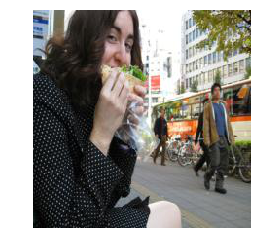

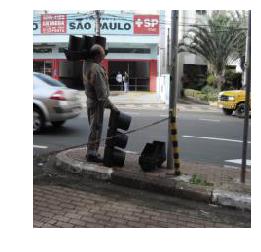

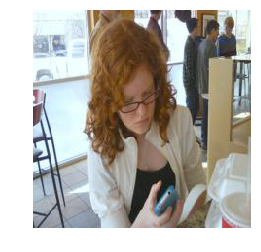

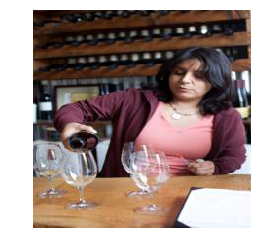

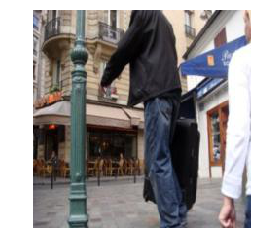

...

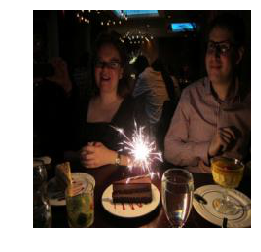

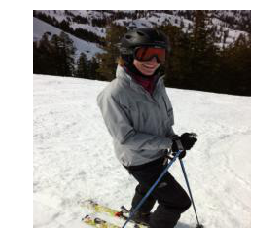

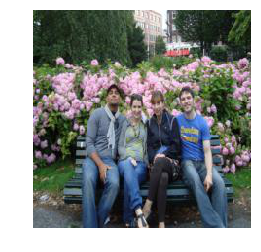

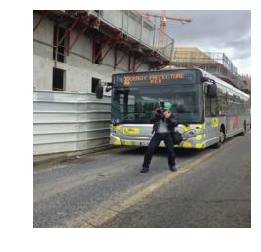

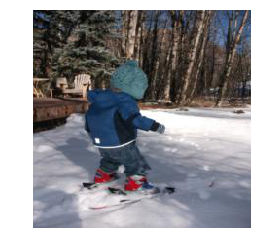

----------------------------------



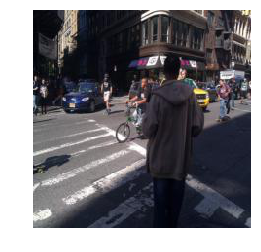

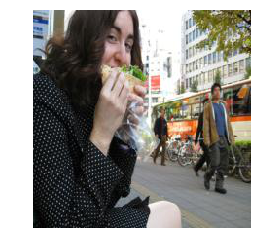

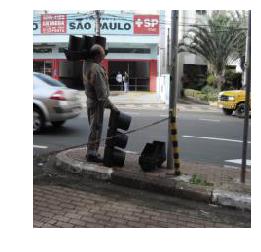

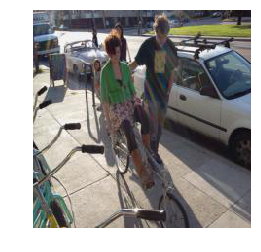

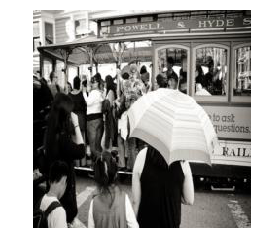

...

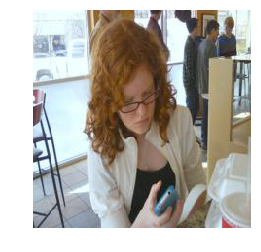

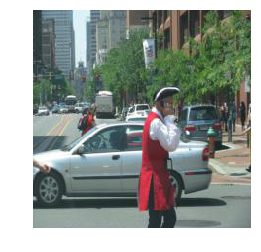

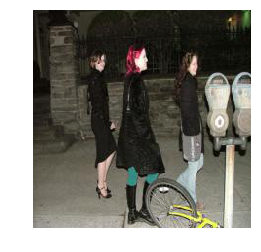

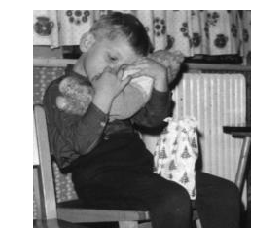

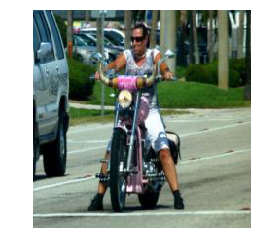

In [34]:
print(test_data[0])
print()

for i in np.argsort(test1[0].tolist()[0])[::-1][0:20]:
    img = Image.open("./data/images_test/" + str(i) + ".jpg")
    img = np.asarray(img)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

print("----------------------------------")
print()
    
for ii in np.argsort(test2[0].tolist()[0])[::-1][0:20]:
    img = Image.open("./data/images_test/" + str(ii) + ".jpg")
    img = np.asarray(img)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

('A woman walking down a street past a doorway. a woman is walking past a doorway on a sidewalk A woman talking on a cell phone checks her watch. A woman talks on a cell phone and checks her watch while walking on a sidewalk. A woman wearing blue is on the phone and walking along a sidewalk in front of a building with black planters on both sides of the entrance.', 0)



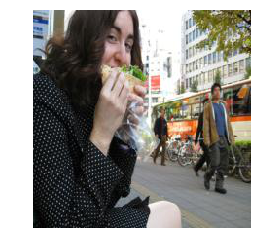

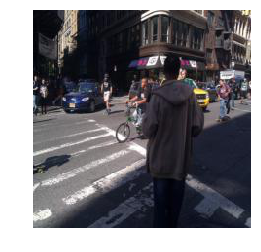

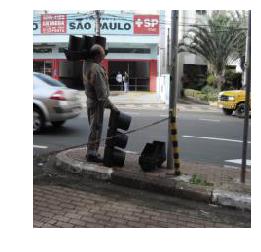

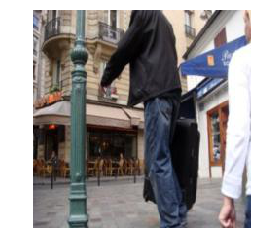

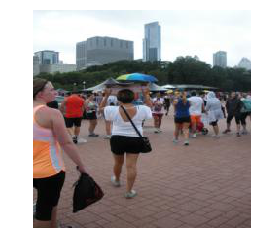

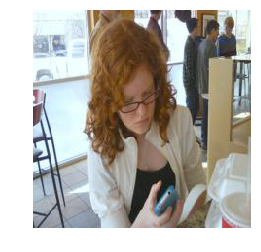

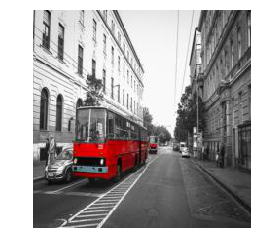

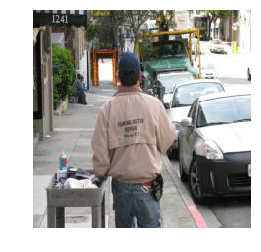

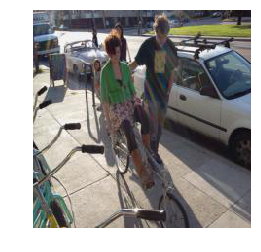

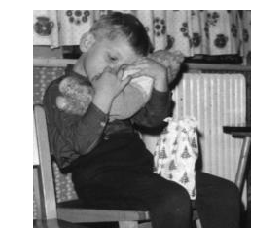

('A large slice of angel food cake sitting on top of a plate. A small plate contains a large slice of cake. A quarter of a cake on a plate A large piece of yellow cake sits on a plate. A large slab of sponge cake sits upon a flowery plate.', 1)



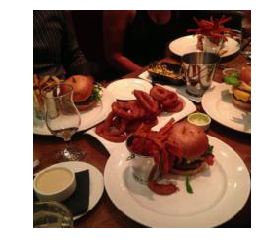

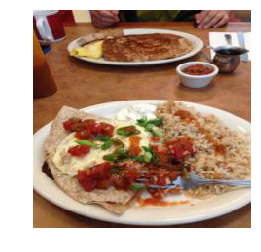

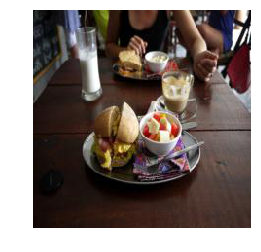

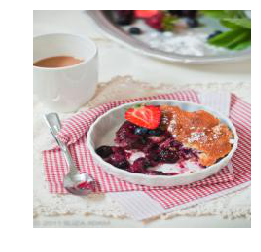

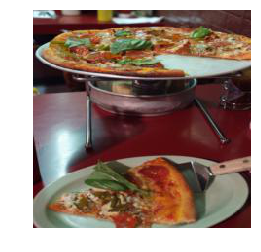

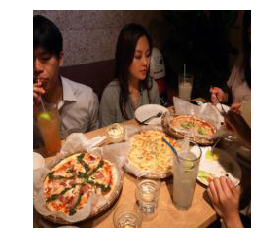

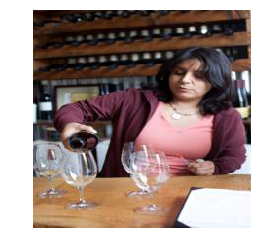

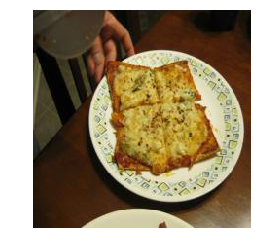

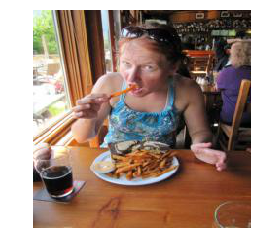

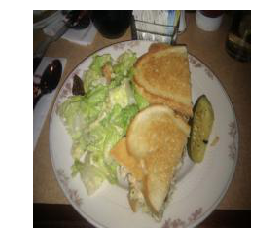

('A group of traffic lights sitting above an intersection. The sign shining down over the street lights A picture of a stoplight from a window. The sun surrounded by an airplane and traffic lights Several street lights and an airplane flying overhead.', 2)



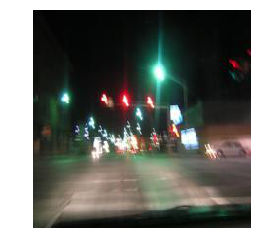

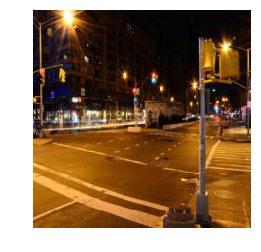

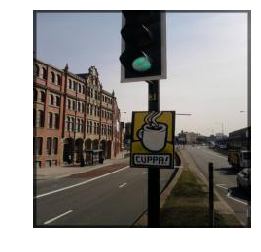

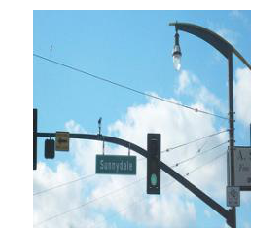

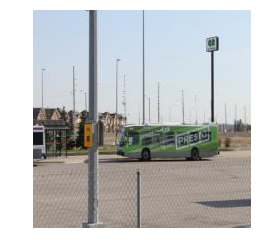

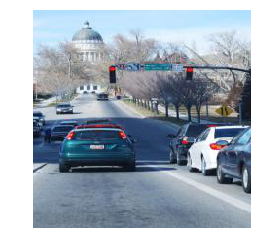

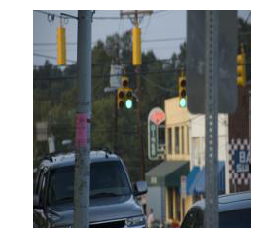

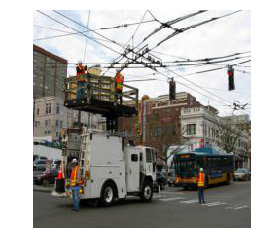

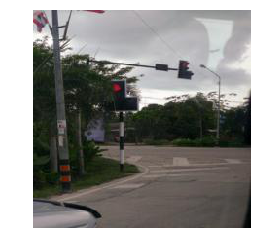

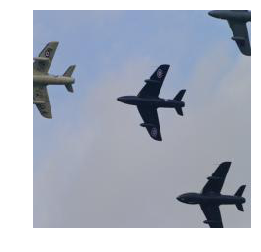

('Two mean in uniform are riding horses side by side on a sandy beach. Two police officers on horses riding on the beach. two people riding on horses in the middle of a lot A pair of police officers ride on horses down the beach. Two people in neon vests riding horses down the beach.', 3)



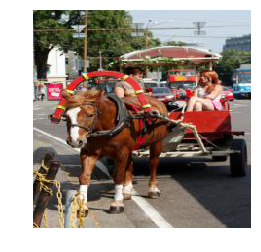

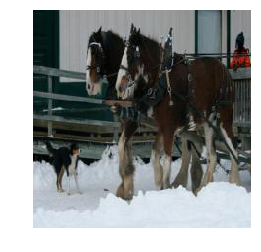

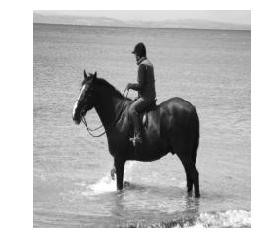

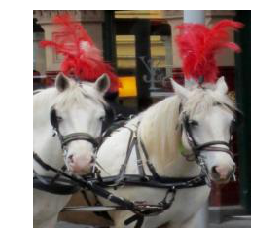

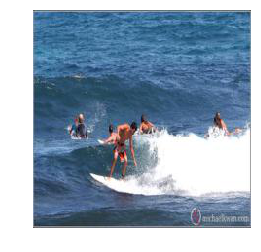

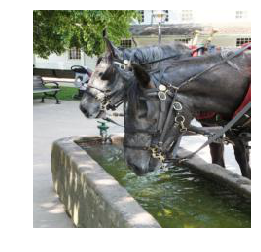

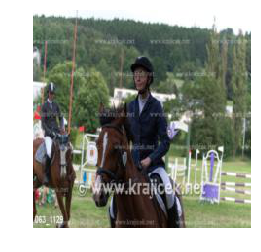

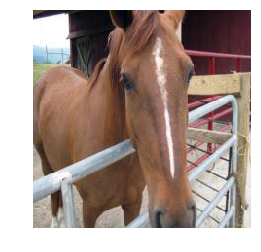

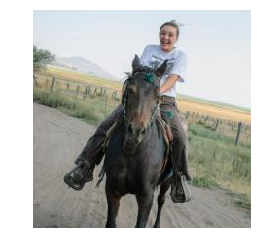

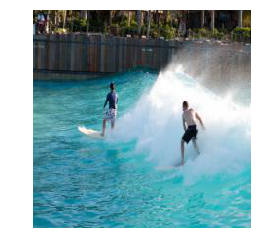

('Man and woman using pay phones at adjacent booths. Adults using pay telephones outdoors while standing next to soda machine. A couple of people on phones standing together. A man and woman are talking on public pay phones. a couple of people that are talking on a phone', 4)



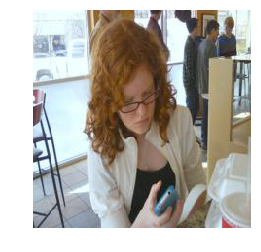

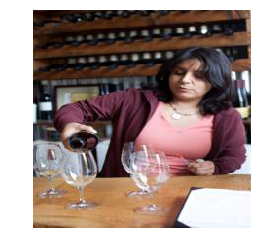

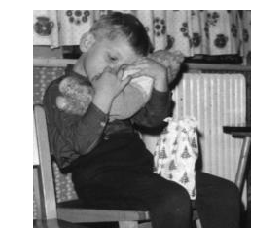

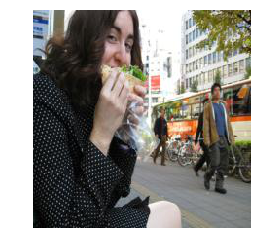

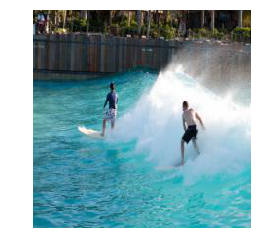

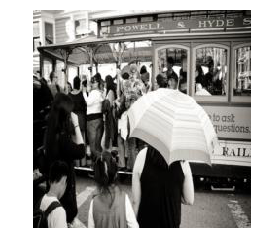

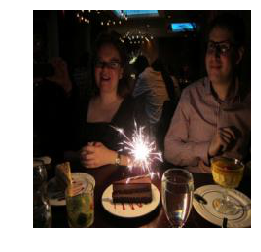

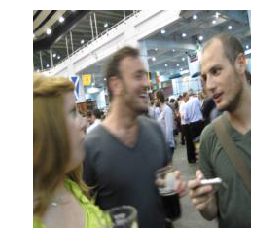

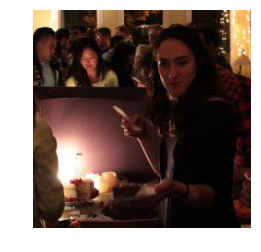

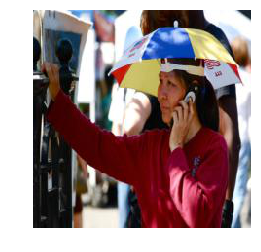

('a man is doing a trick on a skateboard A skateboarder doing a trick in the air, on a wooden ramp with a blue sky and clouds in the background. A person is performing a trick on a skateboard. there is a skateboarder that has jumped on to a ramp A man is jumping on a skateboard in a park.', 5)



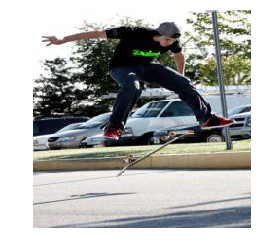

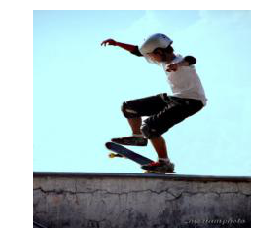

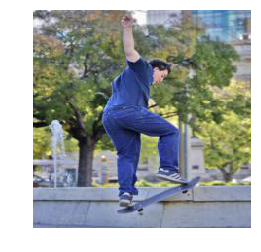

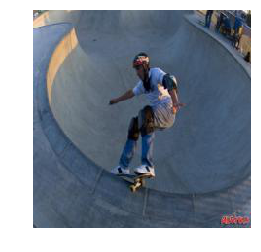

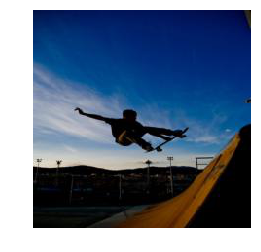

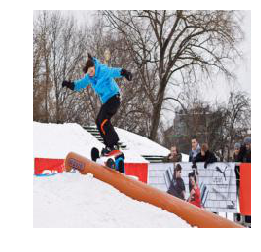

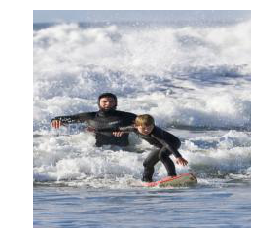

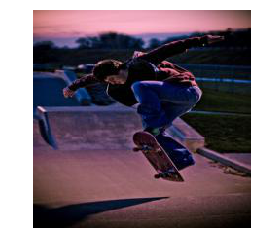

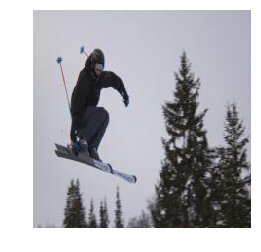

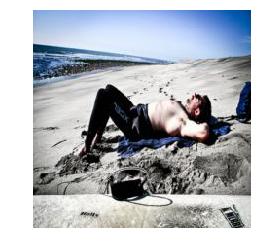

('A person on skis is in the air. There is a person jumping in the air on a pair of skis. The person gets airborne while skiing down the slope. The skier is doing a trick in the air. A skier is mid air on the slopes.', 6)



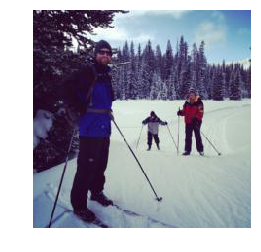

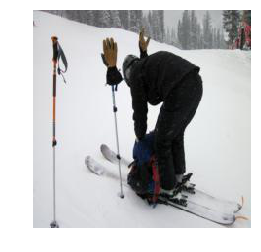

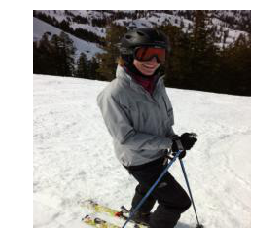

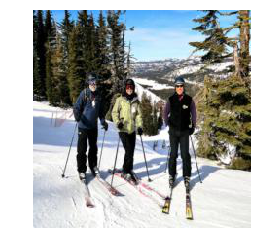

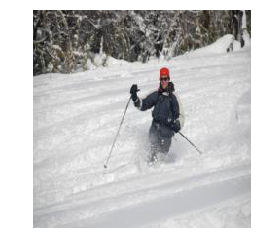

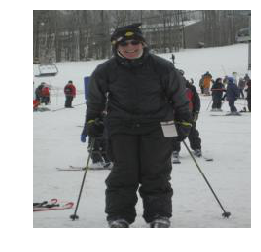

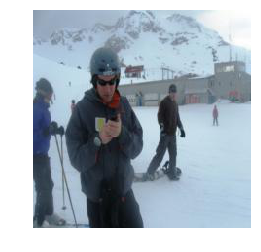

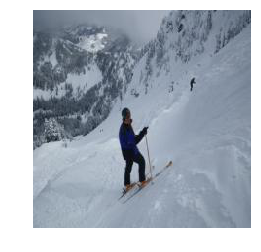

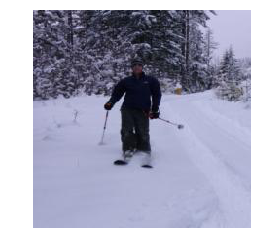

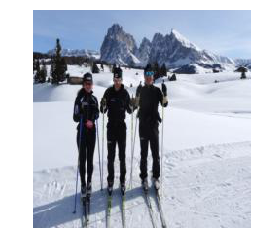

('A man standing next to a zebra on a lawn. a guy showing off a zebra at a building A young man poses next to a zebra in a grassy wildlife exhibit. A man standing next to  zebra on the grass A man standing next to a zebra gesturing toward it.', 7)



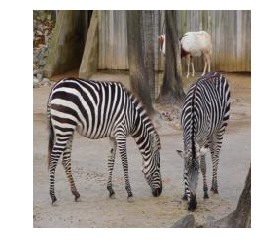

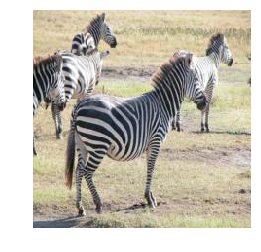

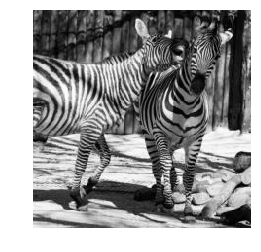

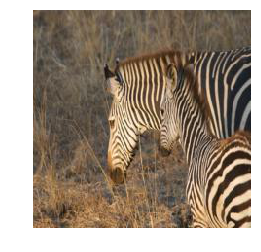

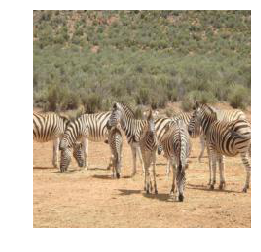

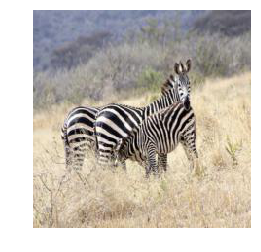

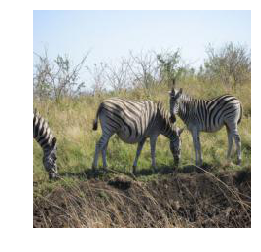

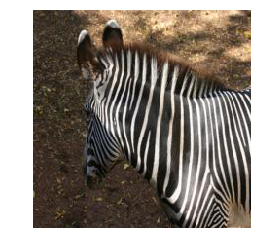

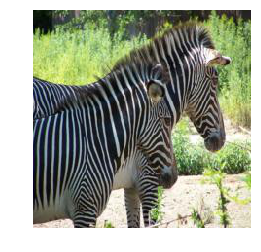

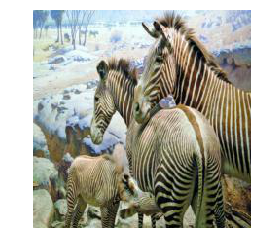

('an orange fire truck parked in a wharehouse An antique truck displayed in a work garage. A red fire engine is parked in the fire station. A red fire engine is inside of a building. The old model fire truck sat alone in the room.', 8)



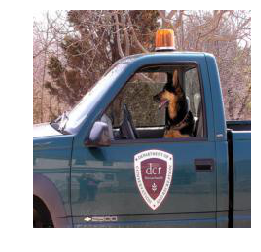

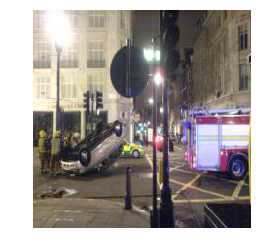

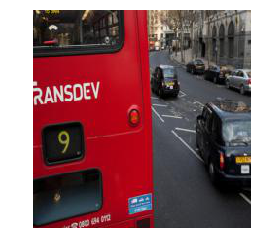

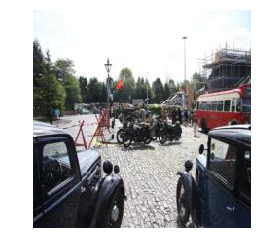

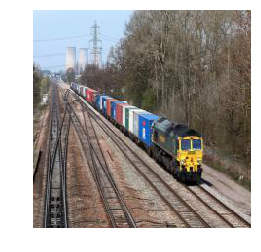

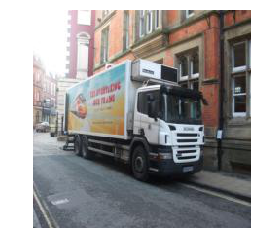

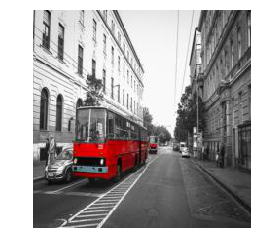

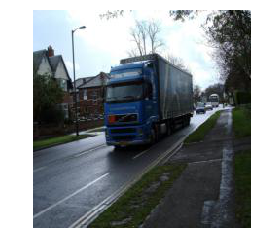

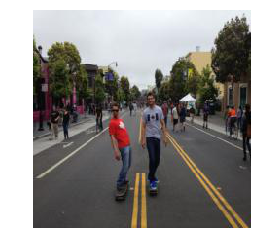

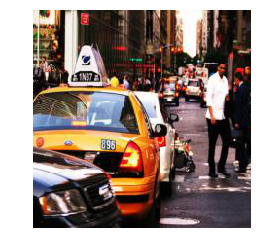

('A few people that are standing with skateboards. A group of skateboarders standing at the top of a ramp with their skateboards resting against the top of the ramp. There are four boys standing at the ready with their skateboards. Four skateboarders stand at the top of a ramp, with their boards, ready to skate. some guys standing on top of ramp with their skateboads', 9)



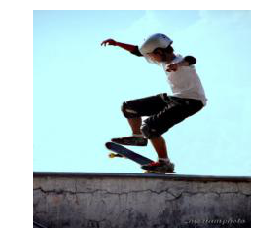

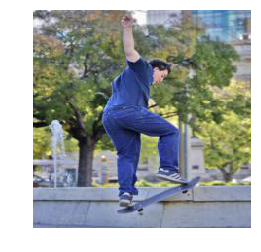

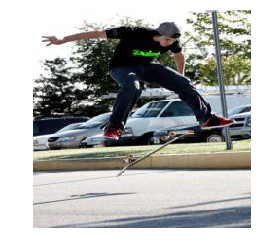

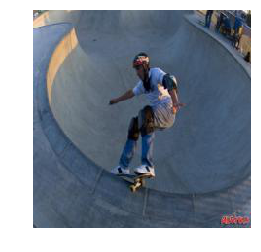

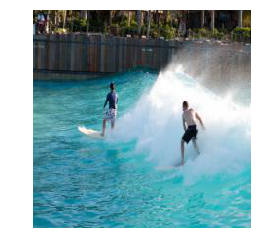

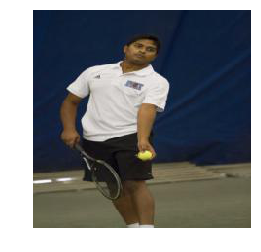

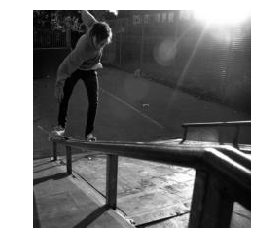

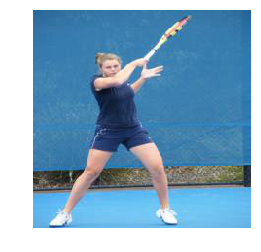

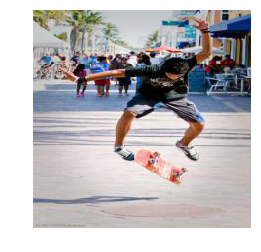

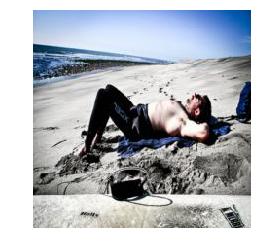

In [35]:
merged_test = (test1 + test2)/2
for i in (range(10)):
    print(test_data[i])
    print()
    for j in np.argsort(merged_test[i].tolist()[0])[::-1][0:10]:
        img = Image.open("./data/images_test/" + str(j) + ".jpg")
        img = np.asarray(img)
        plt.imshow(img)
        plt.axis('off')
        plt.show()